# In-Domain GAN Inversion for Real Image Editing

## Генеративно-состязательная нейросеть(GAN)

**Генеративно-состязательная нейросеть(GAN)** - архитектура, состоящая из генератора и дискриминатора, настроенных на работу друг против друга. Отсюда GAN и получила название генеративно-созтязательная. В случае работы с изображениями, во всем остальном — это сверточная нейронная сеть.

**Дискриминатор**

Дискриминационные алгоритмы пытаются классифицировать входные данные. Учитывая особенности полученных данных, они стараются определить категорию, к которой они относятся.

К примеру, пробегая все слова в письме дискриминационный алгоритм может предсказать, является сообщение спамом или не спамом. Спам — это категория, а пакет слов, собранный из электронной почты — образы, которые составляют входные данные. Математически категории обозначают y, а образы обозначают x. Запись p(y|x) используется для обозначения «вероятности y при заданном x», которая обозначает «вероятность того, что электронное письмо является спамом при имеющемся наборе слов».

Итак, дискриминационные функции сопоставляют образы с категорией. Они заняты только этой корреляцией.

**Генератор**

Генеративные алгоритмы заняты обратным. Вместо того, чтобы предсказывать категорию по имеющимся образам, они пытаются подобрать образы к данной категории.

В то время как дискриминационные алгоритмы волнует взаимосвязь между y и x, генеративные алгоритмы волнует “откуда берутся x”. Они позволяют находить **p(x|y)**, вероятность x при данном y или вероятность образов при данном классе (генеративные алгоритмы также могут использоваться в качестве классификаторов. Они могут делать больше, чем классифицировать входные данные.)

Еще одно представление о работе генеративных алгоритмов можно получить, разделяя дискриминационные модели от генеративных таким образом:

Дискриминационные модели изучают границу между классами;
Генеративные модели моделируют распределение отдельных классов.

**Как работают GAN**

Одна нейронная сеть, называемая генератором, генерирует новые экземпляры данных, а другая — дискриминатор, оценивает их на подлинность; т.е. дискриминатор решает, относится ли каждый экземпляр данных, который он рассматривает, к набору тренировочных данных или нет.

Предположим, мы пытаемся сделать что-то более банальное, чем повторить портрет Моны Лизы. Мы сгенерируем рукописные цифры, подобные тем, что имеются в наборе данных MNIST. Цель дискриминатора — распознать подлинные экземпляры из набора.

Между тем, генератор создает новые изображения, которые он передает дискриминатору. Он делает это в надежде, что они будут приняты подлинными, хотя являются поддельными. Цель генератора состоит в том, чтобы генерировать рукописные цифры, которые будут пропущены дискриминатором. Цель дискриминатора — определить, является ли изображение подлинным.

Шаги, которые проходит GAN:

    1.Генератор получает рандомное число и возвращает изображение.Это сгенерированное изображение подается в дискриминатор  наряду с потоком изображений, взятых из фактического набора данных.
    2.Дискриминатор принимает как реальные, так и поддельные изображения и возвращает вероятности, числа от 0 до 1, причем 1 представляет собой подлинное изображение и 0 представляет фальшивое.
    
   Таким образом, у есть двойной цикл обратной связи:
   - Дискриминатор находится в цикле с достоверными изображениями.
   - Генератор находится в цикле вместе с дискриминатором


Вы можете представить GAN как фальшивомонетчика и полицейского, играющих в кошки мышки, где фальсификатор учится изготавливать ложные купюры, а полицейский учится их обнаруживать. Оба динамичны; т. е. полицейский тоже тренируется (возможно, центральный банк отмечает пропущенные купюры), и каждая сторона приходит к изучению методов другого в постоянной эскалации.

Сеть дискриминаторов представляет собой стандартную сверточную сеть, которая может классифицировать изображения, подаваемые на нее с помощью биномиального классификатора, распознающего изображения как реальные или как поддельные. Генератор в некотором смысле представляет собой обратную сверточную сеть: хотя стандартный сверточный классификатор принимает изображение и уменьшает его разрешение, чтобы получить вероятность, генератор принимает вектор случайного шума и преобразует его в изображение. Первый отсеивает данные с помощью методов понижения дискретизации, таких как maxpooling, а второй генерирует новые данные.



Обе сети пытаются оптимизировать целевую функцию или функцию потерь в игре zero-zum. Это, по сути, модель актера-критика (actor-critic). Когда дискриминатор меняет свое поведение, то и генератор меняет, и наоборот.

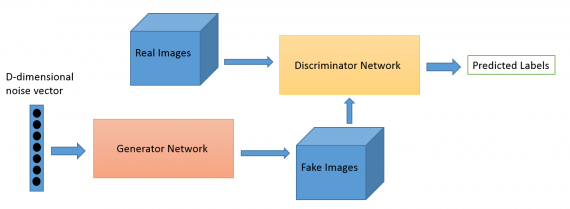

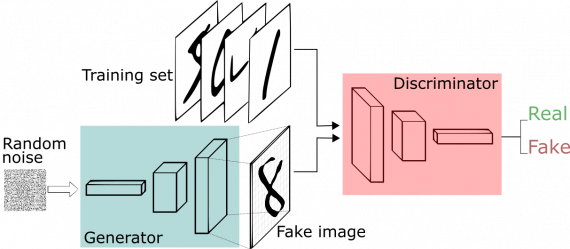

## Обзор

В этой работе утверждается, что задача инверсии GAN требуется не только для восстановления целевого изображения по значениям пикселей, но также для сохранения инвертированного кода в семантической области исходного скрытого пространства хорошо обученных GAN. Для этой цели они предлагают инверсию GAN "в домене" (IDInvert), сначала обучая новый кодировщик, управляемый доменом, который способен генерировать скрытый код в домене, а затем выполняют оптимизацию, регуляризованную по предметной области, которая включает кодировщик в качестве регуляризатора, код внутри скрытого пространства при тонкой настройке. Внутренние коды, созданные IDInvert, обеспечивают высококачественное редактирование реальных изображений с фиксированными моделями GAN.

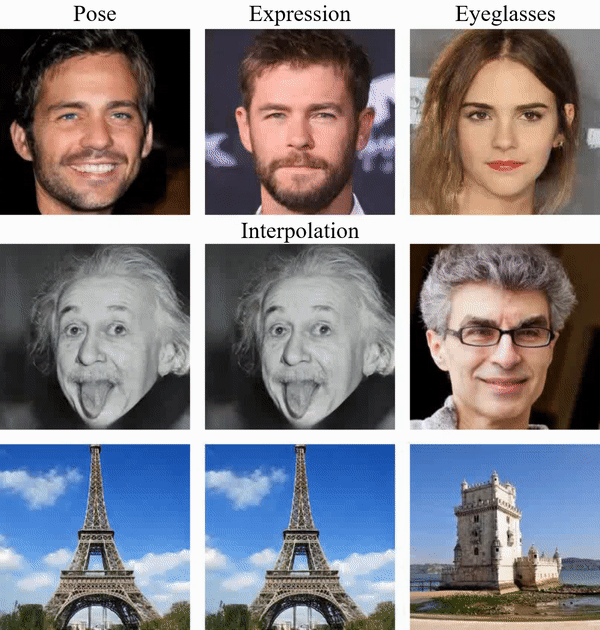

## Введение

Генеративные состязательные сети (GAN) выглядят как игра двух игроков: игра между генератором для
синтеза изображений и дискриминатором для отличия реальных данных от поддельных. GAN спонтанно учатся кодировать богатую семантику внутри скрытого пространства, и изменение
скрытого кода приводит к манипулированию соответствующими атрибутами, возникающими в выходном изображении.
Однако по-прежнему сложно применить такую возможность манипулирования к реальным изображениям, поскольку
GAN не имеют возможности принимать конкретное изображение в качестве входных данных для вывода его скрытого
кода.
    Было предпринято множество попыток обратить процесс генерации вспять путем отображения пространства изображения
обратно в скрытое пространство, которое широко известно как Инверсия GAN.
Они либо изучают дополнительный кодировщик за пределами GAN, либо напрямую оптимизируют скрытый код для
отдельного изображения. Однако существующие методы в основном сосредоточены на восстановлении значений
пикселей входного изображения, оставляя некоторые важные открытые вопросы о свойствах инвертированного кода.
    - Например, находится ли инвертированный код в исходном скрытом пространстве GAN? 
    - Может ли инвертированный код семантически представлять целевое изображение? 
    - Поддерживает ли инвертированный код редактирование изображений путем повторного использования знаний, полученных GAN? 
    - Можем ли мы использовать хорошо обученный GAN для инвертирования любого изображения? 
Ответы на эти вопросы не только углубляют наше понимание внутреннего механизма GAN, но также могут раскрыть предварительно обученные модели GAN для универсальных возможностей редактирования изображений.

   В этой работе показано, что хороший метод инверсии GAN должен не только реконструировать целевое
изображение на пиксельном уровене, но также выравнивать перевернутый код с семантическими знаниями, закодированными в скрытом пространстве. Такие семантически значимые коды мы называем "коды в
домене", поскольку они подчиняются семантической области, изученной GAN. Мы также обнаружили, что внутренние коды
могут лучше поддерживать редактирование изображений за счет повторного использования богатых знаний, полученных в
моделях GAN. С этой целью мы предлагаем подход с инверсией GAN в домене для восстановления входного изображения на как
на уровне пикселей, так и на семантическом уровне. Конкретно мы сначала учим ориентированный на домен кодировщик
для отображения пространства изображения в скрытое пространство таким образом, чтобы все коды, создаваемые
кодировщиком, находились внутри домена. Затем мы выполняем на уровне экземпляра домен-регуляризованную оптимизацию
за счет использования кодировщика в качестве регуляризатора для лучшего восстановления значений пикселей без изменения
семантических свойств инвертированного кода. Мы резюмируем наш вклад следующим образом:
- Мы анализируем важную проблему в задаче инверсии GAN, заключающуюся в том, что инвертированный код должен
выходить за рамки простого восстановления значений пикселей входного изображения путем дальнейшего рассмотрения
семантической информации.
- Мы предлагаем подход инверсии GAN в домене путем изучения сначала доминантного кодировщика и в
дальнейшем использовании этого кодировщика в качестве регуляризатора для домена оптимизации.
- Мы оцениваем наш метод в различных задачах редактирования изображений, как показано на рисунке 1.
Качественные и количественные результаты показывают, что такая инверсия в домене может точно восстанавливать
целевое изображение как из пикселей низкого уровня, так и из семантики высокого уровня, значительно превосходя
существующие подходы.

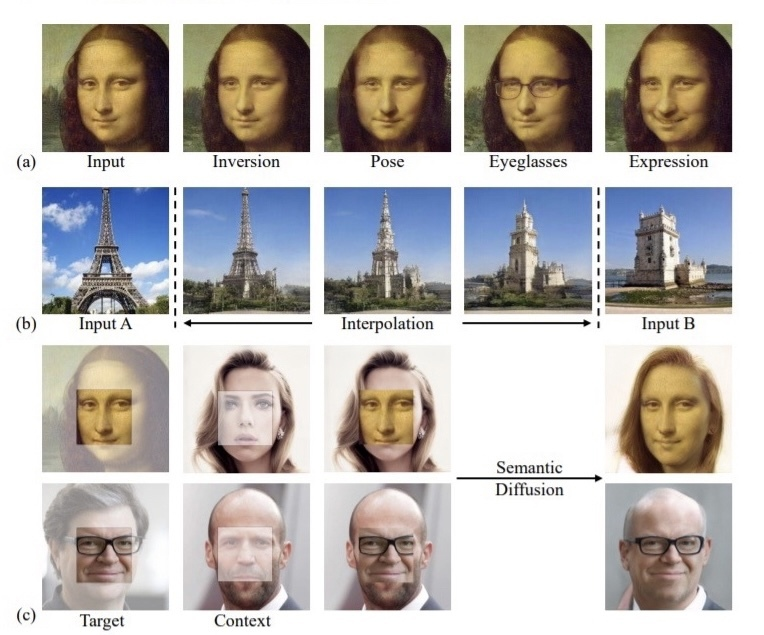
**Генератор GAN** (а) Семантические манипуляции с различными чертами лица. (b) Интерполяция изображения путем
линейной интерполяции двух инвертированных кодов. (c) Семантическая дифференциация, которая отличает целевое лицо
от контекста и делает их совместимыми.

## Сопутствующие работы

**Генеративные состязательные сети (GAN)**

   Изучая распределение реальных изображений с помощью состязательного обучения, GAN в последние годы усовершенствовали синтез изображений. Предлагается множество вариантов GAN для повышения качества синтеза и устойчивости обучения. Недавно было показано, что GAN спонтанно изучают семантику внутри скрытого пространства, которое в дальнейшем можно использовать для управления процессом генерации. Goetschalckx исследовал, как сделать синтез GAN более запоминающимся, Джаханян добился движений камеры и изменения цвета за счет смещения скрытого распределения, Шен интерпретировал скрытое пространство GAN для семантического редактирования лиц, а Ян заметил, что иерархическая семантика возникает из многоуровневых скрытых кодов GAN для синтеза сцены. Однако из-за отсутствия возможности вывода в сетях GAN по-прежнему сложно применить богатую семантику, закодированную в скрытом пространстве, для редактирования реальных изображений.

**GAN Inversion**

   Чтобы лучше применять хорошо обученные сети GAN к реальным приложениям, инверсия GAN позволяет редактировать реальные изображения из скрытого пространства. Учитывая фиксированную модель GAN, инверсия GAN направлена на поиск наиболее точного скрытого кода для восстановления входного изображения. Существующие инверсионные подходы обычно делятся на два типа: 
   - Один основан на обучении, который сначала синтезирует набор изображений со случайно выбранными скрытыми кодами, а затем использует изображения и коды в качестве входных данных и контроля соответственно для обучения детерминированной модели. 
   - Другой - на основе оптимизации, который работает с одним экземпляром один раз, напрямую оптимизирует скрытый код для минимизации потерь при пиксельной реконструкции.
   
Некоторые работы объединяют эти две идеи, используя кодировщик для генерации инициализации для оптимизации. Также существуют модели, которые учитывают обратимость на этапе обучения при разработке новых архитектур. Некоторая параллельная работа улучшает инверсию GAN с лучшим качеством реконструкции: Gu использует несколько скрытых кодов для восстановления одного изображения, Pan оптимизирует параметры генератора вместе со скрытым кодом, Каррас Абдал фокусируется на инвертировании моделей StyleGAN, используя послойные шумы.

**Ключевые отличия**

   Одна важная проблема, упущенная существующими методами инверсии, заключается в том, что
они просто фокусируются на восстановлении целевого изображения на уровне пикселей без учета семантической
информации в инвертированном коде. Если код не может быть согласован с семантической областью скрытого
пространства, даже имея возможность восстанавливать попиксельные значения входного изображения, он все равно
не сможет повторно использовать знания, полученные GAN, для семантического редактирования. Поэтому в этой
работе мы утверждаем, что использование только потерь при пиксельной реконструкции в качестве метрики для
оценки подхода инверсии GAN недостаточно. Вместо этого мы глубоко изучаем свойство инвертированного кода из семантический
уровень и предлагают
Инверсия GAN в домене, которая хорошо поддерживает редактирование реальных изображений

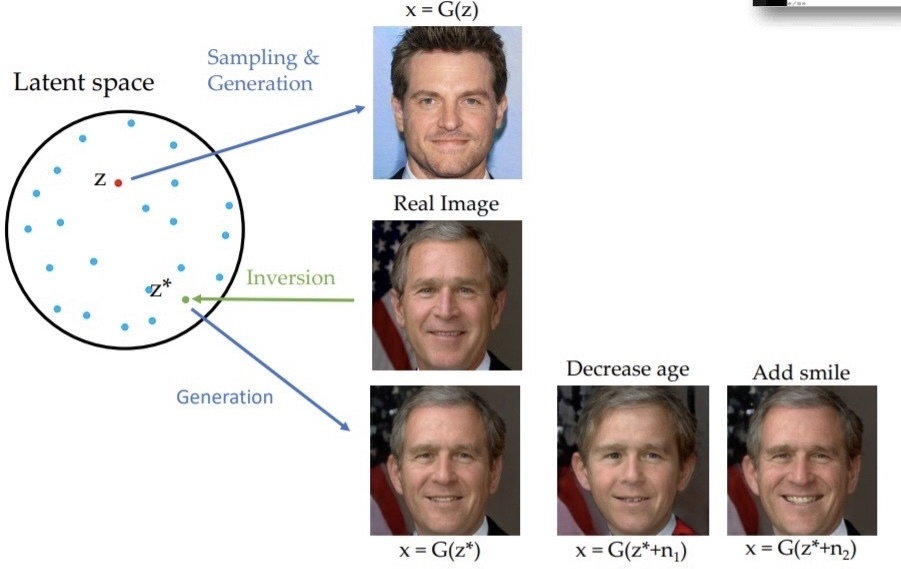

## In-Domain GAN Inversion

Как обсуждалось выше, при инвертировании модели GAN, помимо восстановления входного изображения по значениям
пикселей, мы также заботимся о том, является ли инвертированный код семантически значимым. Здесь семантика
относится к возникающим знаниям, которые GAN извлек из наблюдаемых данных. Для этого мы
предлагаем сначала обучить ориентированный на домен кодировщик, а затем использовать этот кодировщик в качестве
регуляризатора для дальнейшей домен-регуляризованной оптимизации, как показано на рис.2.


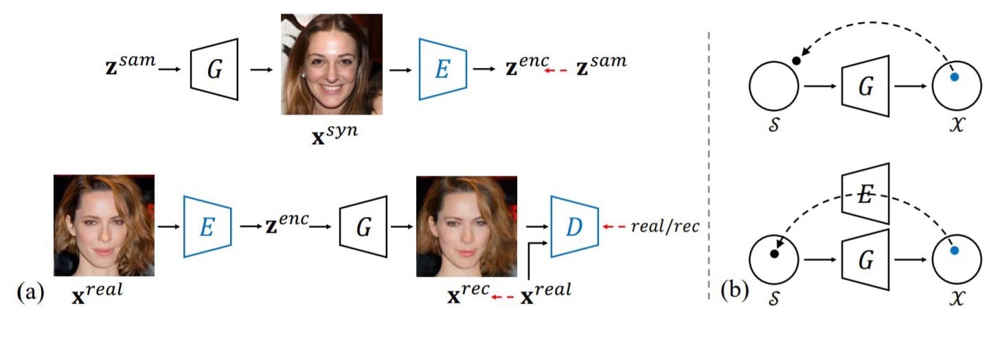
**Рис. 2** ( а) Сравнение обучения обычного кодировщика и доминантный энкодер для инверсии GAN. Блоки модели: синие - обучаемые части и красными пунктирными стрелками обозначены наблюдения. Вместо того, чтобы обучаться на
синтезированных данных для восстановления скрытого кода, наши ориентированный на домен кодировщик обучен с
целью восстановления реальных изображений. Фиксированный Генератор задействован для того, чтобы коды,
создаваемые кодировщиком, лежали в собственном скрытом пространстве генератора и оставались семантически
значимыми. (б) Сравнение обычной оптимизации и нашей домен-регуляризованный оптимизация. Хорошо обученный ориентированный на домен кодировщик включен как регуляризатор, чтобы поместить
скрытый код в семантическую область во время процесса оптимизации


**Постановка задачи.** Прежде чем вдаваться в подробности, мы кратко представим постановку задачи с некоторыми
основными обозначениями. Модель GAN обычно состоит из генератора: $$G(·):Z→X$$ чтобы синтезировать качественные изображения и дискриминатор D(·), чтобы отличать реальные данные от синтезированных. 
Инверсия GAN изучает обратное отображение G(·), который должен найти лучший скрытый код $z^{inv}$, чтобы восстановить данное реальное изображение $x^{real}$ 
Мы обозначаем семантическое пространство, изученное GAN, как S. Мы хотели бы, чтобы $z^{inv}$
также соответствовало предыдущим знаниям S в предварительно обученной модели GAN.

**Выбор скрытого пространства.** Обычно в GAN используются скрытые коды z из заранее определенного распределенного
пространства Z, например нормально распределенного. Недавняя модель StyleGAN предлагает сначала отобразить
исходное скрытое пространство Z во второе скрытое пространство W с многослойным персептроном (MLP), а затем
подать коды w ∈ W
к генератору для синтеза изображений. Уже доказано, что такое дополнительное отображение позволяет изучать более
распутанную семантику. В результате распутанное пространство W широко используется для задачи инверсии GAN. Аналогично мы также выбираем W пространство как пространство инверсии по трем причинам: (i) мы
фокусируемся на семантическом (т.е. внутри домена) свойстве инвертированных кодов, составляющих пространство W,
более подходящее для анализа. (ii) Обращение к пространству W обеспечивает лучшую производительность чем пространство Z. (iii) Легко ввести W пространство для любой модели GAN, просто изучив дополнительный
MLP перед генератором. Следовательно, это не повредит обобщающей способности нашего подхода. В данной
работе мы проводим все эксперименты на пространстве W, но наш подход может быть выполнен и на пространстве Z
тоже. Для простоты мы используем z для обозначения скрытого кода в следующих разделах.


## 2.1 Кодировщик с доменным управлением

Обучение кодировщика обычно используется для решения проблемы инверсии GAN, учитывая его
быструю скорость вывода. Однако существующие методы просто изучают детерминированную модель без учета
того, совпадают ли коды, созданные кодировщиком, с семантическими знаниями, полученными G(·). Как
показано в верхней части рисунка 2 (а), набор скрытых кодов $z^{sam}$ отбираются случайным образом и передаются в
G(·) чтобы получить соответствующий синтез $x^{syn}$. Затем кодировщик E(·) берет $x^{syn}$
и $z^{sam}$ в качестве входов и надзора соответственно и обучается по

$$ min
(Θ_{E})
L_{E} = ||z^{sam} − E(G(z^{sam}))||_{2} $$

где $||·||_{2}$ обозначает $l_{2}$ расстояние и $Θ_{E}$ представляет параметры кодировщика E(·). Мы утверждаем, что
наблюдение путем только реконструкции $z^{sam}$ не является
достаточно мощным, чтобы обучить точный кодировщик. Кроме того, генератор фактически опущен и не может
предоставить знания в своей области для обучения кодировщика, поскольку градиенты из G(·) вообще не
принимаются во внимание.
Для решения этих проблем предлагаем обучить ориентированный на домен энкодер, который
показан в нижнем ряду рис.2 (а). Есть три основных различия
по сравнению с обычным энкодером: 
   1. Выход энкодера подается в
генератор для восстановления входного изображения так, чтобы целевая функция поступала из пространства
изображения, а не из скрытого пространства. Это включает в себя семантические знания от генератора при
обучении и обеспечивает более информативный и точный контроль. Таким образом, выходной код
гарантированно соответствует семантической области генератора.
   2. Вместо обучения на синтезированных изображениях, ориентированный на домен кодировщик обучается на реальных изображениях, что делает наш кодировщик более применимым в реальных приложениях.
   3. Чтобы убедиться, что восстановленное изображение достаточно реалистично, мы используем дискриминатор, чтобы конкурировать с кодировщиком. Таким образом, мы можем получить как можно больше информации из модели GAN ( т.е. используются оба двух компонента GAN).

Метод состязательного обучения также подталкивает выходной код к тому, чтобы лучше соответствовать
семантическим знаниям генератора. Мы также вводим потерю восприятия, используя функцию, извлеченную
VGG. Следовательно, тренировочный процесс можно сформулировать как: 

$$ min(Θ_{E})L_{E} = ||x^{real} − G(E(x^{real}))||_{2} + λ_{vgg}||F(x^{real}) − F(G(E(x^{real})))||_{2}
− λ_{adv} E
(x^{real}∼P_{data})
[D(G(E(x_{real})))] (2) $$

$$ min(Θ_{D})L_{D} = E
(x^{real}∼P_{data})
[D(G(E(x^{real})))] − E
(x^{real}∼P_{data})
[D(x^{real})]
+
γ/2
E
(x^{real}∼P_{data})
[||∇xD(x^{real})||_{2}^{2}
] (3)$$

где  $P_{data}$ обозначает распределение реальных данных и γ является гиперпараметром для
градиент регуляризации. $λ_{vgg}$ и $λ_{adv}$ - веса потерь восприятия и дискриминатора. F(·) обозначает
модель извлечения признаков VGG.

## 2.2 Оптимизация домена


В отличие от процесса создания сетей GAN, который изучает отображение на уровне распределения, т.е. от скрытого
распространения к распространению реального изображения, инверсия GAN больше похожа на задачу уровня экземпляра,
которая состоит в том, чтобы наилучшим образом восстановить данное индивидуальное изображение. С этой точки зрения трудно
научиться идеальному обратному отображению с одним кодером из-за его ограниченных возможностей представления.
Следовательно, даже если инвертированный код из предложенного ориентированного на домен кодировщика может хорошо
реконструировать входное изображение на основе предварительно обученного генератора и гарантировать, что сам код будет
семантически значимым, нам все равно нужно доработать код, чтобы он лучше соответствовал целевому индивидуальному
изображению по значениям пикселей.

Предыдущие методы предлагали алгоритм градиентного спуска для оптимизации кода. Верхний ряд
рисунка 2 (b) иллюстрирует процесс оптимизации, в котором скрытый код оптимизируется «свободно» на основе
только генератора. Очень вероятно, что это может привести к инверсии вне домена, поскольку на скрытый код нет
никаких ограничений. Полагаясь на наши ориентированный на домен кодировщик, мы проектируем домен-регуляризованный
оптимизация с двумя улучшениями, как показано в нижней части рисунка 2 (b): 

   1) Мы используем вывод ориентированного
на домен кодировщика в качестве идеальной отправной точки, которая предотвращает застревание кода на
локальном минимуме, а также значительно сокращает процесс оптимизации. 

   2) Мы включаем ориентированный на домен кодировщик
как регуляризатор для сохранения скрытого кода в семантической области генератора. Подводя итог,
целевая функция для оптимизации:

$$ z^{inv} = arg min
z
||x − G(z)||_{2} + λ_{vgg}||F(x) − F(G(z))||_{2}
+ λ_{dom}||z − E(G(z))||_{2} $$

где **x** целевое изображение, которое нужно инвертировать. $λ_{vgg}$ и $ λ_{dom}$ - веса потерь, соответствующие
потерям восприятия и регуляризатору кодера соответственно.

## Эксперименты

В этом разделе мы экспериментально покажем превосходство предложенной инверсии GAN в домене по сравнению с
существующими методами с точки зрения сохранения семантической информации, качества инверсии, скорости вывода, а
также редактирования реальных изображений.

**3.1 Экспериментальные настройки.**

Набор данных:
 - Flickr-Faces-HQ Dataset(FFHQ), который содержит 70 000 высококачественных изображений лиц(1024х1024)
 - The Large-scale Scene Understanding (LSUN), который состоит из изображений из 10 различных категорий сцен. 
 
 При обучении кодировщика генератор фиксированный и мы обновляем только кодировщик и дискриминатор в соответствии с уравнением (2) и уравнением (3). Что касается потери восприятия в уравнении (2), мы берем conv4 3 как выход VGG. Вес потерь установлен как $λ_{vgg} = 5е^{-5}$, $λ_{adv} = 0,1$ и γ = 10. Мы устанавливаем $λ_{dom} = 2$ в уравнении (4) для домен-регуляризованной оптимизации.

**3.2 Семантический анализ инвертированных кодов.**

В этой части мы оцениваем, как инвертированные коды могут семантически представлять целевые изображения.
Как указывалось в предыдущих работах, скрытое пространство GAN линейно разделимо с точки зрения
семантики. В частности, для двоичного атрибута (например, мужчина против женщины), можно найти скрытую
гиперплоскость, в которой все точки с одной стороны соответствуют одному и тому же атрибуту. Мы используем
это свойство для оценки соответствия между инвертированными кодами и скрытой семантикой.
Мы собираем 7000 реальных изображений лиц и используем стандартные классификаторы атрибутов, чтобы предсказать возраст
(молодые против старый), пол (женский против мужской), очки (отсутствие против
присутствие) и поза (слева против право). Эти прогнозы считаются неопровержимыми. Затем мы используем
современный метод инверсии GAN, Image2StyleGAN, и предлагаемую нами инверсию GAN в домене,
чтобы инвертировать эти изображения обратно в скрытое пространство фиксированной Модель StyleGAN,
которая обучена на наборе данных FFHQ. InterFaceGAN используется для поиска семантических границ для
вышеупомянутых атрибутов в скрытом пространстве. Затем мы используем эти границы как а также инвертированные коды для оценки эффективности классификации атрибутов. 

На рис.3 показаны
кривые precision-recall для каждой семантики. Мы легко можем сказать, что коды, инвертированные нашим
методом, более семантически значимы. Это количественно демонстрирует эффективность предложенного
нами в домене инверсия для сохранения свойства семантики инвертированного кода.


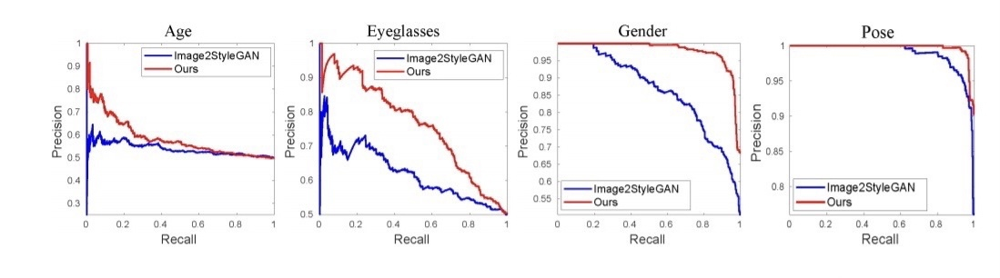
**Рис. 3.** Кривые precision-recall с использованием перевернутых кодов для классификации атрибутов лица. Инверсия в домене показывает гораздо лучшую производительность, чем Image2StyleGAN, что предполагает более сильную
семантическую сохранность.

**3.3 Качество и скорость инверсии.**

Как обсуждалось выше, наш метод может производить коды в домене для задачи инверсии GAN. В этой
части мы хотели бы убедиться, что улучшение нашего подхода с семантического аспекта не влияет на
его производительность на традиционной метрике оценки, т.е. качество восстановления изображения. На
рисунке 4 показано качественное сравнение различных методов инверсии, включая обучение
традиционного кодировщика, оптимизацию на основе MSE, а также предложенные нами
ориентированный на домен кодировщик и в домене инверсия. Сравнение между рис. 4 (б) и рис. 4 (г) показывает
превосходство наших ориентированного на домен кодировщика в обучении лучшему отображению пространства
изображения в скрытое пространство. Кроме того, наш полный алгоритм (рис. 4 (е)) показывает лучшее качество
реконструкции. В Таблице 1 приведены результаты количественного сравнения, где в домене инверсия
превосходит других конкурентов по всем параметрам, включая расстояние начала Фреше ([FID](https://ru.qaz.wiki/wiki/Fr%C3%A9chet_distance)), нарезанное
несоответствие Вассерштейна ([SWD](https://ru.qaz.wiki/wiki/Wasserstein_metric)) и среднеквадратичную ошибку (MSE). Скорость вывода также показана в
Табл.1. Наш ориентированный на домен кодировщик может дать гораздо лучшие результаты восстановления по
сравнению с традиционным кодировщиком с сопоставимым временем вывода. Это также обеспечивает лучшую
инициализацию для дальнейшей домен-регуляризированной оптимизации,что приводит к значительно более высокой скорости (∼ В 35
раз быстрее), чем современный метод оптимизации.

Таблица 1. Количественное сравнение различных методов инверсии. Для каждой модели мы инвертируем 500 изображений для
оценки. ↓ означает, что чем меньше число, тем лучше.
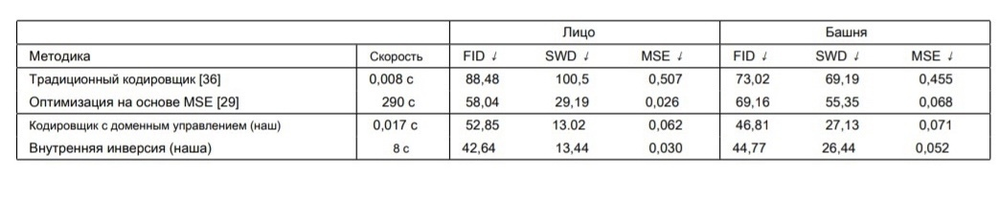

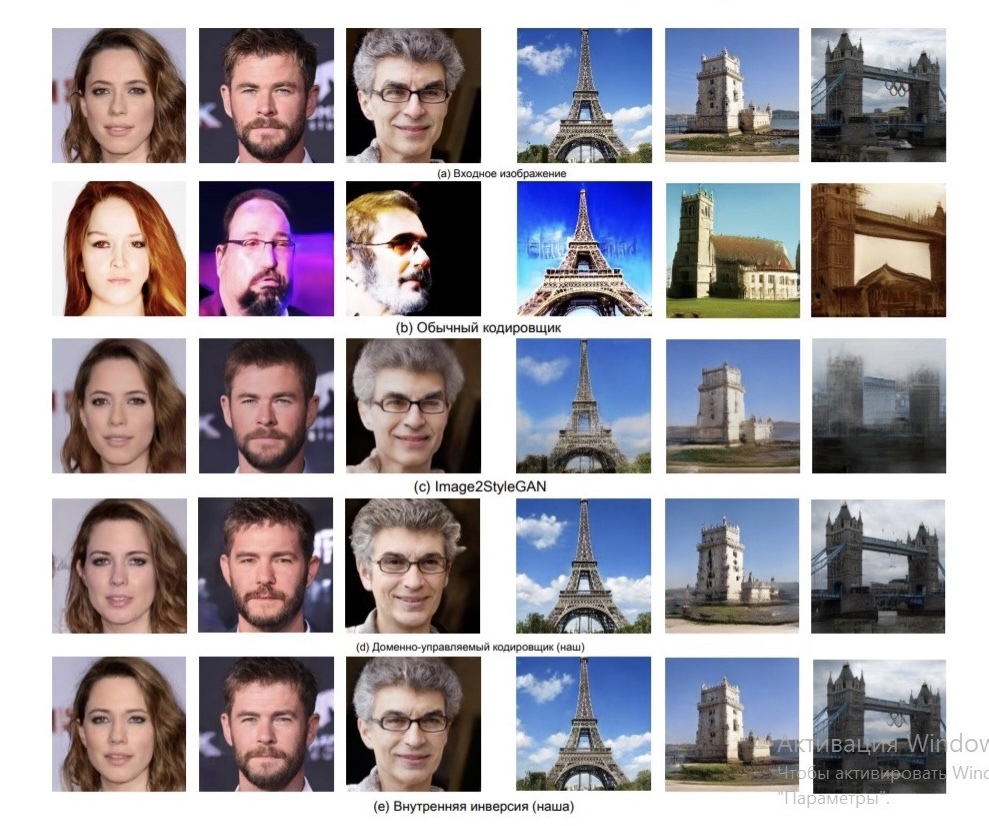
Рис. 4. Качественное сравнение восстановления изображений с помощью различных методов инверсии GAN. (а) Входное
изображение. (б) Обычный кодировщик. (c) Image2StyleGAN. (d) Предлагаемые нами ориентированный на домен кодировщик.
е) предлагаемые нами инверсия в домене.

**3.4 Редактирование реального изображения.**

В этом разделе мы оцениваем наш подход GAN-инверсии в домене к задачам редактирования реальных изображений, включая
интерполяцию изображений и семантическую обработку изображений. Мы также предлагаем новую задачу редактирования
изображений, которая называется семантическая диффузия образов,
чтобы увидеть, как наш подход может адаптировать контент одного изображения к другому и сохранить
семантически значимые и легко совместимые результаты.

**Интерполяция изображений.** Интерполяция изображений направлена на семантическую интерполяцию двух
изображений, что подходит для исследования семантики, содержащейся в инвертированных кодах. Другими
словами, для хорошей инверсии семантика должна непрерывно изменяться при интерполяции двух
инвертированных кодов. 

Мы проводим эксперименты с наборами данных лица и башни, чтобы более всесторонне
проанализировать семантическое свойство. Для набора данных лиц наш метод позволяет получить более гладкие
интерполированные лица, чем Image2StyleGAN. Например,в первых двух рядах рисунка 5 очки искажаются во время процесса интерполяции с помощью Image2StyleGAN,
и переход от женского к мужскому неестественен. 

Для изображений башен, которые намного разнообразнее
лиц, результаты интерполяции Image2StyleGAN демонстрируют артефакты и размытость. Напротив, наши
инвертированные коды приводят к более удовлетворительной интерполяции. Примечательно, что при
интерполяции двух башен разных типов (например, один с одним шпилем, а другой с несколькими шпилями),
интерполированные изображения с использованием нашего подхода по-прежнему представляют собой башни
высокого качества. Это демонстрирует в домене свойство нашего алгоритма. Количественная оценка в Таблице
2 дает такой же вывод.


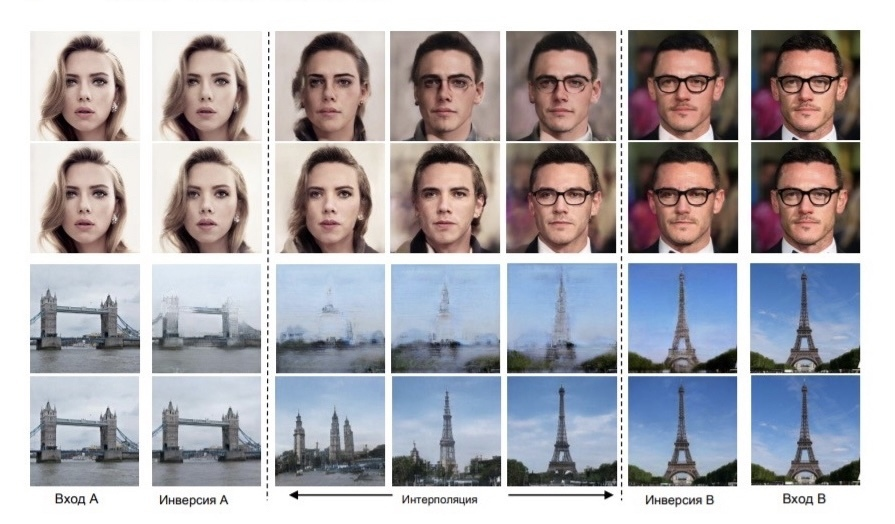
**Рис. 5.** Качественное сравнение интерполяции изображений между Image2StyleGAN (нечетные строки) и нашим в
домене инверсия (четные строки).

Таблица 2. Количественное сравнение интерполяции изображений и манипуляций между Image2StyleGAN и инверсии в домене. ↓ означает, что чем меньше число, тем лучше
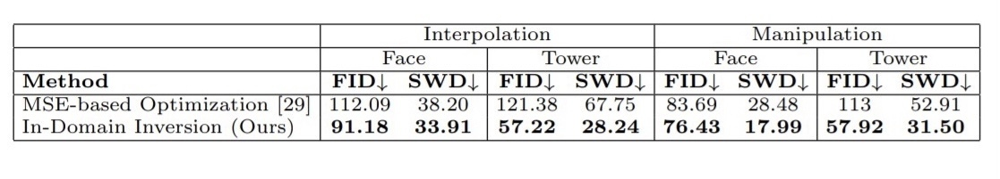

**Семантическая манипуляция.** Манипуляция изображениями - еще один способ проверить, совпадают ли встроенные
скрытые коды с семантическими знаниями, полученными GAN. Как указывалось в предыдущей работе GAN
могут изучать богатую семантику в скрытом пространстве, позволяя манипулировать изображениями путем
линейного преобразования скрытого представления. Это можно сформулировать как $$x^{edit} = G(z^{inv} + αn)$$ где n нормальное направление, соответствующее определенной семантике в скрытом пространстве, и α это
шаг для манипуляции. Другими словами, если скрытый код перемещается в этом направлении, семантика,
содержащаяся в выходном изображении, должна соответственно меняться. Следуем для поиска
смыслового направления п.
Рис.6 и Рис.7 показывают результаты сравнения манипулирования лицами и башнями с помощью
Images2StyleGAN и инверсии GAN в домене. Если взять в качестве примера манипуляцию
лицом (рис.6), волосы актрисы становятся размытыми после поворота позы с использованием Image2StyleGAN, и
идентичность сильно меняется при редактировании выражения лица и очков с помощью кодов из Image2StyleGAN.
Это потому, что он фокусируется только на восстановлении значений каждого пикселя, но опускает семантическую
информацию, содержащуюся в инвертированных кодах. Напротив, инверсия в домене может сохранить
большинство других деталей при редактировании особый лицевой атрибут. 

Что касается манипуляций с башней, на рис.7 мы видим, доменный подход
превосходит оптимизацию на основе MSE как за счет уменьшения, так и увеличения семантического уровня.
Например, при удалении или добавлении облаков на небе Image2StyleGAN размывает башню вместе с небом,
поскольку восстанавливает изображение только на уровне пикселей без учета семантического значения
восстановленных объектов. Таким образом, облако добавляется ко всему изображению независимо от того,
принадлежит ли конкретная область к небу или к башне. Напротив, новый алгоритм почти не влияет на саму
башню при редактировании облаков, предполагая, что инверсия в домене может производить
семантически информативные скрытые коды для реконструкции изображения. 


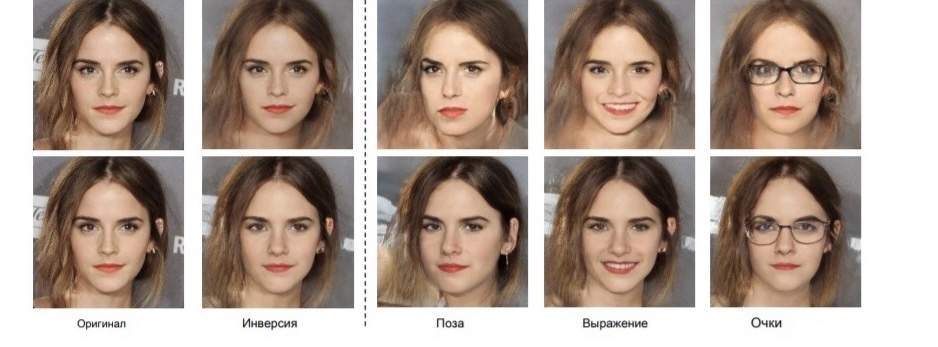
**Рис. 6.** Сравнение Image2StyleGAN(верхний ряд) и нашего в домене инверсия (нижний ряд) при
манипулировании лицевыми атрибутами.

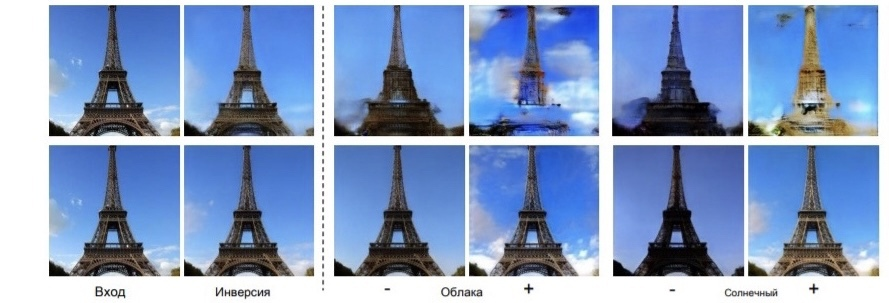
**Рис. 7.** Сравнение Image2StyleGAN (верхний ряд) и нашего в домене инверсия (нижний ряд) при редактировании
изображения башни. Для манипулирования каждым атрибутом мы показываем результаты, уменьшая или увеличивая
семантическую степень.

**Семантическая диффузия.** Семантическая диффузия направлена на дифференциацию использования определенной
части (обычно наиболее представительной части) целевого изображения в контексте другого изображения. Мы хотели
бы, чтобы объединенный результат сохранил характеристики целевого изображения ( например, идентичность лица) и
одновременно адаптировать контекстную информацию. На рис.8 показаны некоторые примеры, в которых успешно
использованы различные целевые лица в различных контекстах, используя подход с инверсией GAN в домене. Мы
можем видеть, что результаты хорошо сохраняют идентичность лица цели и разумно интегрируются в различное
окружение. Это отличается от смешивания стилей, поскольку центральная область результирующего
изображения остается такой же, как и у целевого изображения.

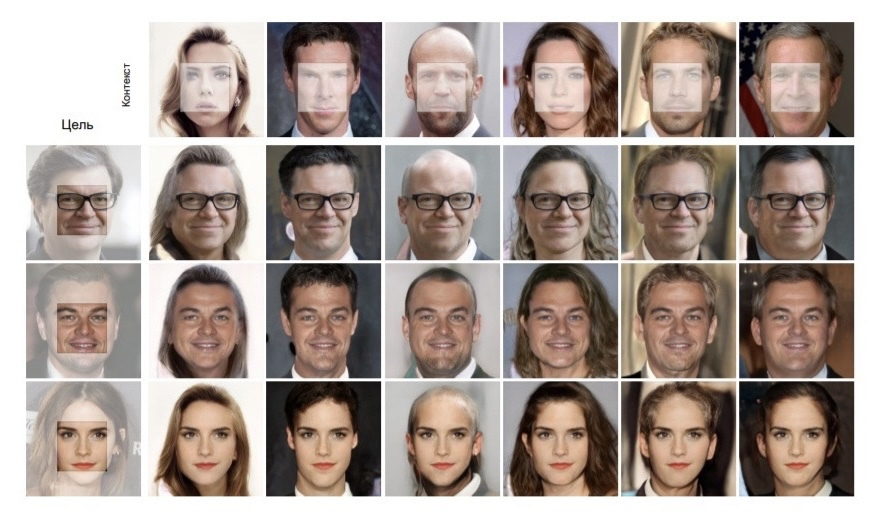
**Рис. 8.** Результат семантической дифференциации с использованием нашего в домене Инверсия GAN. Целевые изображения (первый столбец)
плавно переходят в контекстные изображения (первая строка), в то время как идентификатор остается таким же, как и целевой.

## 3.5 Исследование абляции


В этой части мы проводим исследование абляции, чтобы проанализировать предложенную инверсию в домене. После первоначального обучения кодировщика выполняем домен оптимизация каждого изображения
для дальнейшего улучшения качества реконструкции. В отличие от предыдущей оптимизации на основе MSE,
мы задействуем изученные ориентированный на домен кодировщик в качестве регуляризатора для размещения
инвертированного кода внутри семантической области, как описано в уравнении (4). Здесь мы исследуем роль
кодировщик в процессе оптимизации, варьируя вес λ дом в уравнении (4). На рис.9 показано сравнение
между $λ_{dom} = 0, 2, 40$. Мы наблюдаем разлад между
качество восстановления изображения и качество обработки. Больше $λ_{dom}$ будет смещать оптимизацию в
сторону ограничения области, так что инвертированные коды
более семантически значимы. Вместо этого цена состоит в том, что целевое изображение не может быть идеально
восстановлено для попиксельных значений. На практике мы устанавливаем $λ_{dom} = 2$.

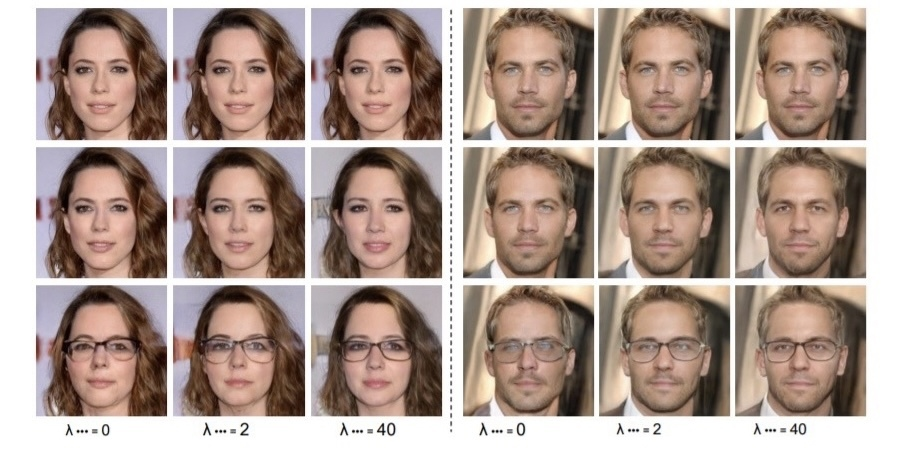
**Рис.9.** Исследование абляции потери веса в уравнении (4) для домен-регуляризованный
оптимизация. Сверху вниз: исходные изображения, восстановленные изображения и
результаты манипуляции (ношение очков). Для каждой группы изображений вес $λ_{dom}$
устанавливается равным 0, 2, 40. Когда λ дом равно 0, дает наилучшую реконструированную
результаты, но относительно плохие результаты манипуляции. Когда λ дом равно 40, мы получаем худшую реконструкцию, но
более приятную манипуляцию.

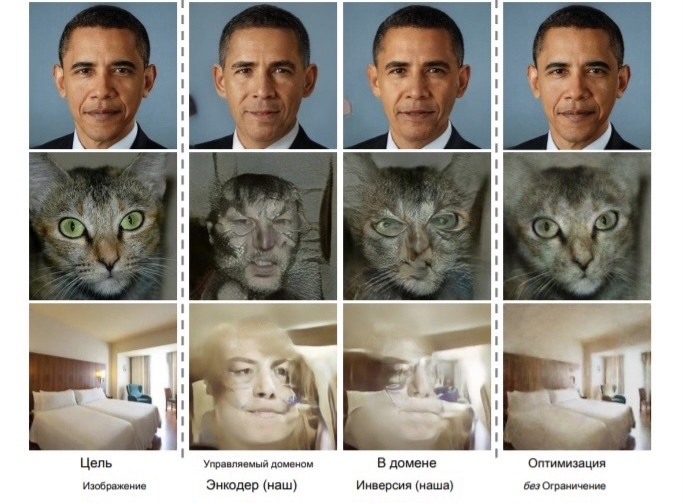
**Рис 10.** Результаты инвертирования лица, кошачьей морды и спальни с использованием одной и той же модели синтеза лица.
Слева направо: целевые изображения, результаты реконструкции с выходами из
ориентированный на домен кодировщик, результаты реконструкции с предложенными в домене инверсия, результаты
реконструкции путем прямой оптимизации скрытого кода без с учетом выравнивания домена.


## Обсуждение и заключение


В этой работе исследуется семантическое свойство инвертированных кодов в задаче инверсии GAN и
предлагается новый метод инверсии в домене. В работе показано, что кода, который просто
восстанавливает значение пикселя целевого изображения, недостаточно для представления изображения на смысловом уровне. 

Например, на рис.10 мы инвертируем разные типы
экземпляров изображений ( т.е. лицо, морда кошки и спальня) с моделью синтеза лица. В последнем столбце показаны
результаты Image2StyleGAN, который восстанавливает кошку или спальню со знаниями предметной области,
наученными синтезировать человеческие лица. В отличие от этого, контур лица все еще можно наблюдать на
реконструкциях с использованием нашего в домене инверсия (третий столбец). Это демонстрирует, с другой стороны,
превосходство подхода в создании семантически значимых кодов. 

Если взять в качестве примера
перевернутую спальню (третья строка), изображение спальни находится за пределами области обучающих данных, и
модель GAN не должна иметь возможность изучать семантику, связанную со спальней. Соответственно, повторное
использование информации о лицах для представления спальни некорректно. Хотя мы всегда можем использовать
больше параметров, чтобы изменить значения пикселей спальни (например, последний столбец), такая подгонка не
сможет поддерживать семантическую обработку изображений. 

С этой точки зрения инверсия в домене помещает
инвертированный код внутрь исходного домена, чтобы сделать его семантически значимым. Другими словами, мы
стремимся найти наиболее подходящий код для восстановления целевого изображения как на уровне пикселей, так
и на семантическом уровне. Такая инверсия в домене значительно облегчает редактирование реальных изображений.